In [1]:
import pandas as pd
import numpy as np
import os
import matplotlib.pyplot as plt
import seaborn as sns
import importlib
import EDA as eda 
import Feature_eng as feature_eng
import CT_model_training as CT_model_training
import CNN as CNN
importlib.reload(eda)
importlib.reload(feature_eng)
importlib.reload(CT_model_training)
importlib.reload(CNN)



Package versions: 

numpy 2.3.5
scipy 1.16.3
pandas 2.3.3
seaborn 0.13.2
scikit-learn 1.7.2
graphviz 0.21
dtreeviz 2.3.2
optuna 4.8.0
shap 0.51.0
Package versions: 

numpy 2.3.5
pandas 2.3.3
scikit-learn 1.7.2
torch 2.11.0+cu126
Package versions: 

numpy 2.3.5
scipy 1.16.3
pandas 2.3.3
seaborn 0.13.2
scikit-learn 1.7.2
graphviz 0.21
dtreeviz 2.3.2
optuna 4.8.0
shap 0.51.0
Package versions: 

numpy 2.3.5
pandas 2.3.3
scikit-learn 1.7.2
torch 2.11.0+cu126


<module 'CNN' from 'c:\\Users\\kaspe\\OneDrive\\Documents\\USYD-Kasper\\Year 3\\QBUS3820\\Assignment\\Code\\QBUS3820-Group-Assignment\\CNN.py'>

In [2]:
import warnings
warnings.filterwarnings('ignore') 

# Plot settings
sns.set_context('notebook') # optimises figures for notebook display
sns.set_style('ticks') # set default plot style
colours = ['#4E79A7','#F28E2C','#E15759','#76B7B2','#59A14F', 
          '#EDC949','#AF7AA1','#FF9DA7','#9C755F','#BAB0AB']
sns.set_palette(colours) # set custom color scheme

%matplotlib inline
plt.rcParams['figure.figsize'] = (9, 6)
plt.rcParams['figure.dpi'] = 80
%config InlineBackend.figure_format = 'retina'

In [3]:
churn, churn_train, churn_valid, churn_test = feature_eng.adaptive_churn(eda.transactions, k=6)
print(churn.head())
print(churn.value_counts())
print(80*'=')
print(churn_train.value_counts())
print(churn_valid.value_counts())
print(churn_test.value_counts())

# DEBUG: Check the threshold calculation



household_id
1    0
2    0
3    0
4    0
5    1
Name: churn, dtype: int64
churn
0    2057
1     412
Name: count, dtype: int64
churn
0    1450
1     274
Name: count, dtype: int64
churn
0    306
1     64
Name: count, dtype: int64
churn
0    296
1     74
Name: count, dtype: int64


In [4]:
churn, churn_train, churn_valid, churn_test = feature_eng.churn(eda.transactions, threshold_days=21)
print(churn.head())
print(churn.value_counts())
print(80*'=')
print(churn_train.value_counts())
print(churn_valid.value_counts())
print(churn_test.value_counts())

household_id
1    0
2    1
3    0
4    1
5    1
Name: churn, dtype: int64
churn
0    1897
1     572
Name: count, dtype: int64
churn
0    1335
1     389
Name: count, dtype: int64
churn
0    282
1     88
Name: count, dtype: int64
churn
0    275
1     95
Name: count, dtype: int64


              spend_trend
household_id             
1               -0.362018
2               -0.230025
3                0.000000
4               -0.735811
6                0.268712
...                   ...
500             -1.000000
1013            -1.000000
1523            -1.000000
509             -1.000000
1022            -1.000000

[2469 rows x 1 columns]
spend_trend shape: (2469, 1)
churn_aligned shape: (2469,)


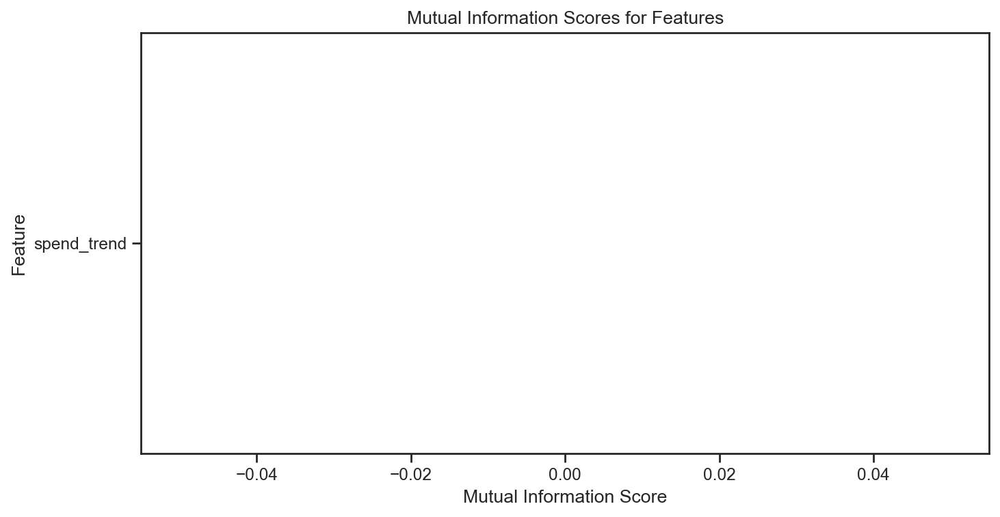

,MI
spend_trend,0


In [5]:
spend_trend = feature_eng.spend_trend(eda.transactions)
print(spend_trend)

# Align churn with spend_trend (filter to matching households)
churn_aligned = churn[churn.index.isin(spend_trend.index)]
print(f"spend_trend shape: {spend_trend.shape}")
print(f"churn_aligned shape: {churn_aligned.shape}")

# Plot spend trend vs churn using mutual information
eda.mutual_information_table(spend_trend, target=churn_aligned, continuous=list(spend_trend.columns))

              visit_trend
household_id             
1               -0.324074
2               -0.146341
3                0.000000
4               -0.666667
6                0.109375
...                   ...
500             -1.000000
1013            -1.000000
1523            -1.000000
509             -1.000000
1022            -1.000000

[2469 rows x 1 columns]
visit_trend shape: (2469, 1)
churn_aligned shape: (2469,)


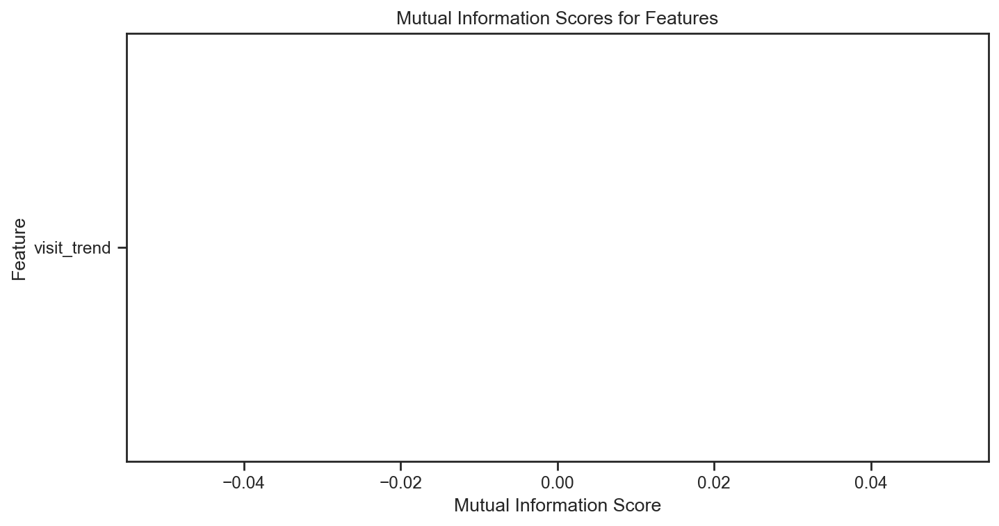

,MI
visit_trend,0


In [6]:
visit_trend = feature_eng.visit_trend(eda.transactions)
print(visit_trend)

# Align churn with visit_trend (filter to matching households)
churn_aligned = churn[churn.index.isin(visit_trend.index)]
print(f"visit_trend shape: {visit_trend.shape}")
print(f"churn_aligned shape: {churn_aligned.shape}")

# Plot visit trend vs churn using mutual information
eda.mutual_information_table(visit_trend, target=churn_aligned, continuous=list(visit_trend.columns))

In [7]:
transactions, demographics, products, campaigns, campaign_descriptions, promotions, coupons, coupon_redemptions = eda.retrieve_data()
churn, churn_train, churn_valid, churn_test = feature_eng.churn(transactions, threshold_days=21)

transactions_train, transactions_valid, transactions_test = eda.clean_transactions(eda.transactions)
campaigns_train, campaigns_valid, campaigns_test = eda.clean_campaigns(campaigns)


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1469307 entries, 0 to 1469306
Data columns (total 12 columns):
 #   Column                 Non-Null Count    Dtype         
---  ------                 --------------    -----         
 0   household_id           1469307 non-null  int64         
 1   store_id               1469307 non-null  int64         
 2   basket_id              1469307 non-null  int64         
 3   product_id             1469307 non-null  int64         
 4   quantity               1469307 non-null  int64         
 5   sales_value            1469307 non-null  float64       
 6   retail_disc            1469307 non-null  float64       
 7   coupon_disc            1469307 non-null  float64       
 8   coupon_match_disc      1469307 non-null  float64       
 9   week                   1469307 non-null  int64         
 10  transaction_timestamp  1469307 non-null  datetime64[ns]
 11  transaction_datetime   1469307 non-null  datetime64[ns]
dtypes: datetime64[ns](2), float6

In [8]:

X_train = feature_eng.build_features(transactions_train, campaigns_train, campaign_descriptions, promotions, coupon_redemptions, products)
y_train = churn_train

X_valid = feature_eng.build_features(transactions_valid, campaigns_valid, campaign_descriptions, promotions, coupon_redemptions, products)
y_valid = churn_valid

X_test = feature_eng.build_features(transactions_test, campaigns_test, campaign_descriptions, promotions, coupon_redemptions, products)
y_test = churn_test

In [9]:
# Align train
common_train = X_train.index.intersection(y_train.index)
X_train = X_train.loc[common_train]
y_train = y_train.loc[common_train]

# Align valid
common_valid = X_valid.index.intersection(y_valid.index)
X_valid = X_valid.loc[common_valid]
y_valid = y_valid.loc[common_valid]

# Align test
common_test = X_test.index.intersection(y_test.index)
X_test = X_test.loc[common_test]
y_test = y_test.loc[common_test]

# Verify
print(X_train.index.equals(y_train.index))  # True
print(X_valid.index.equals(y_valid.index))  # True
print(X_train.shape, y_train.shape)
print(X_valid.shape, y_valid.shape)

True
True
(1724, 18) (1724,)
(370, 18) (370,)


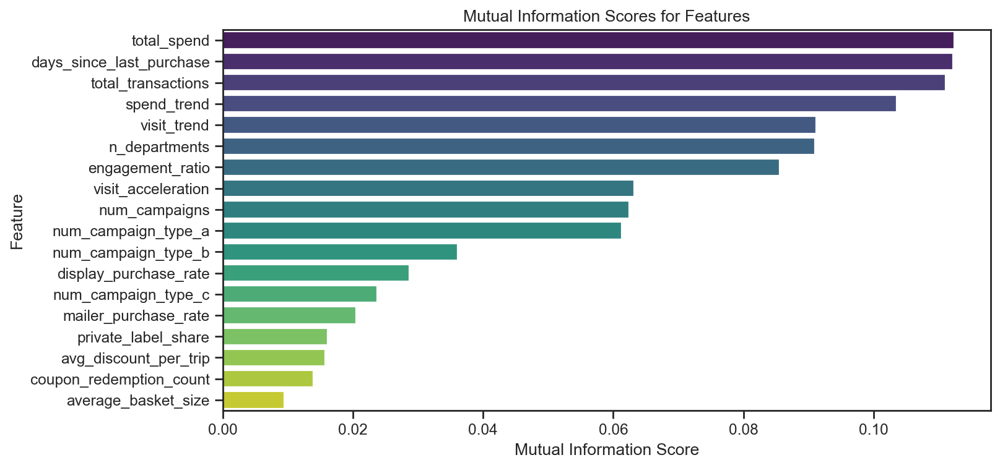

,MI
total_spend,0.112376
days_since_last_purchase,0.112217
total_transactions,0.111062
spend_trend,0.103548
visit_trend,0.091127
n_departments,0.090992
engagement_ratio,0.085585
visit_acceleration,0.063219
num_campaigns,0.062444
num_campaign_type_a,0.061253


In [10]:
#testing mutual information on all features combined to see what is most important to predict churn

eda.mutual_information_table(X_train, target=y_train)

## Decision Tree

### Original Model

In [11]:

clf = CT_model_training.train_decision_tree(X_train, y_train, criteria='entropy', leaf_nodes = 10)
features = list(X_train.columns)
print(features)
# Graphviz visualization
graph = CT_model_training.visualize_tree(clf, features)
graph
### Cost-Complexity Pruning
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import GridSearchCV


model = DecisionTreeClassifier(criterion='entropy', min_samples_leaf=5)
path = model.cost_complexity_pruning_path(X_train, y_train)
alphas = path.ccp_alphas
model = DecisionTreeClassifier(criterion='entropy', min_samples_leaf=5)

search_space = {
    'ccp_alpha': alphas,
}

# Select alpha by grid search
tree_search = GridSearchCV(model, search_space, cv = 5 , scoring='neg_log_loss')
tree_search.fit(X_train, y_train)
tree = tree_search.best_estimator_

print('Best parameters found by grid search:', tree_search.best_params_, '\n')
import graphviz
from sklearn.tree import export_graphviz

dot_data = export_graphviz(tree, out_file=None , impurity=False, feature_names = features,
                           class_names=['No-Churn','Churn'], rounded=True) 
graph = graphviz.Source(dot_data)
graph.render('tree02', format='png') # saves tree to a file
graph

['total_spend', 'total_transactions', 'average_basket_size', 'days_since_last_purchase', 'coupon_redemption_count', 'spend_trend', 'visit_trend', 'num_campaigns', 'num_campaign_type_a', 'num_campaign_type_b', 'num_campaign_type_c', 'display_purchase_rate', 'mailer_purchase_rate', 'private_label_share', 'n_departments', 'avg_discount_per_trip', 'visit_acceleration', 'engagement_ratio']


Best parameters found by grid search: {'ccp_alpha': np.float64(0.008476889862221948)} 



### Optimized model

In [ ]:
# Optimized Decision Tree with stronger regularization and cross-validation

from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import GridSearchCV

# More aggressive regularization to prevent overfitting
param_grid_dt = {
    'max_depth': [3, 4, 5, 6, 7],
    'min_samples_split': [20, 30, 40, 50],
    'min_samples_leaf': [10, 15, 20, 25],
    'max_features': ['sqrt', 'log2'],
    'ccp_alpha': [0.0001, 0.001, 0.01, 0.02]
}

tree_optimized = GridSearchCV(
    DecisionTreeClassifier(criterion='entropy', class_weight='balanced', random_state=42),
    param_grid_dt,
    cv=5,
    scoring='roc_auc',
    n_jobs=-1,
    verbose=1
)

tree_optimized.fit(X_train, y_train)
tree_opt_final = tree_optimized.best_estimator_

print('Best parameters found:', tree_optimized.best_params_)
print('Best CV score:', tree_optimized.best_score_)

# Evaluate on validation set
valid_auc_opt = roc_auc_score(y_valid, tree_opt_final.predict_proba(X_valid)[:, 1])
print(f'Optimized Decision Tree - Valid AUC: {valid_auc_opt:.3f}')

Fitting 5 folds for each of 640 candidates, totalling 3200 fits
Best parameters found: {'ccp_alpha': 0.001, 'max_depth': 5, 'max_features': 'sqrt', 'min_samples_leaf': 25, 'min_samples_split': 20}
Best CV score: 0.8381256695863437
Optimized Decision Tree - Valid AUC: 0.827


## Random Forest

### Original Model

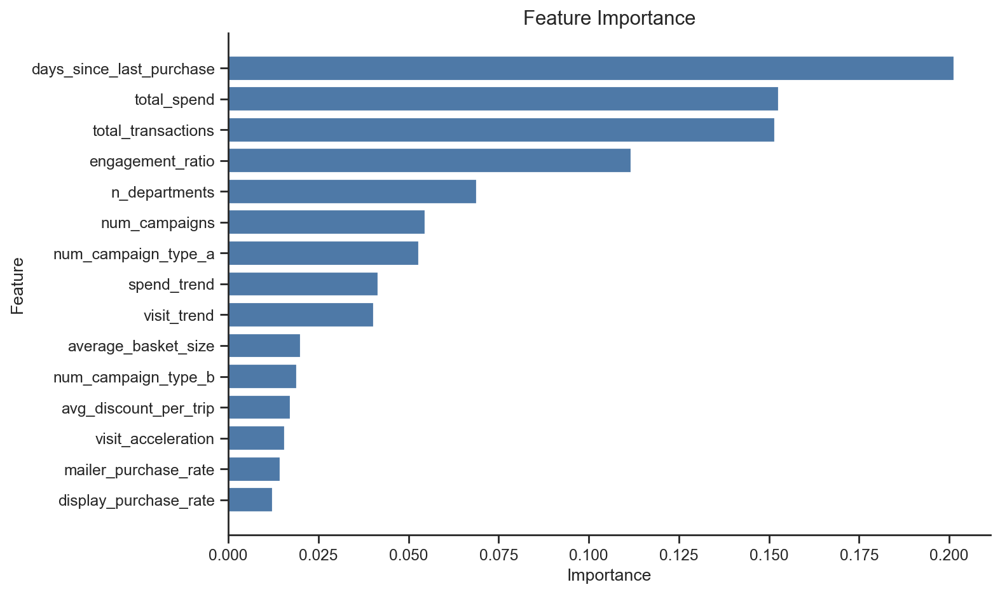

In [ ]:

from sklearn.ensemble import RandomForestClassifier

rf =  RandomForestClassifier(n_estimators=100,  criterion='entropy',  max_features = 3, min_samples_leaf= 5)
rf.fit(X_train, y_train)
import optuna
from optuna.samplers import TPESampler
from sklearn.model_selection import cross_val_score

optuna.logging.set_verbosity(optuna.logging.WARNING) # Swithing off ouput, remove this line to see more details

def objective(trial):
    
    criterion = trial.suggest_categorical('criterion', ['entropy', 'gini'])
    min_samples_leaf = trial.suggest_int('min_samples_leaf', 1, 50)
    max_features = trial.suggest_int('max_features', 1, 24)
    
    
    model = RandomForestClassifier(n_estimators = 100,  
                                  criterion = criterion,  
                                  max_features = max_features, 
                                  min_samples_leaf= min_samples_leaf,
                                  random_state = 1)
    
    scores = cross_val_score(model, X_train, y_train, cv = 5, scoring = 'neg_log_loss')
    loss = - np.mean(scores)
    
    return loss

sampler = TPESampler(seed=42) 
study = optuna.create_study(direction='minimize', sampler=sampler)
study.optimize(objective, n_trials = 100, timeout = 120)  # use a higher timeout when trying to maximize accuracy, as opposed to prototyping
params = study.best_params
params
rf = RandomForestClassifier(n_estimators=1000, **params, class_weight='balanced')
rf.fit(X_train, y_train)
CT_model_training.plot_feature_importance(rf, features)
plt.show()

### Optimized model

Best parameters: {'n_estimators': 1998, 'max_depth': 16, 'min_samples_split': 18, 'min_samples_leaf': 10, 'max_features': 'log2'}
Best CV AUC score: 0.8725475523228333
Optimized Random Forest - Valid AUC: 0.859


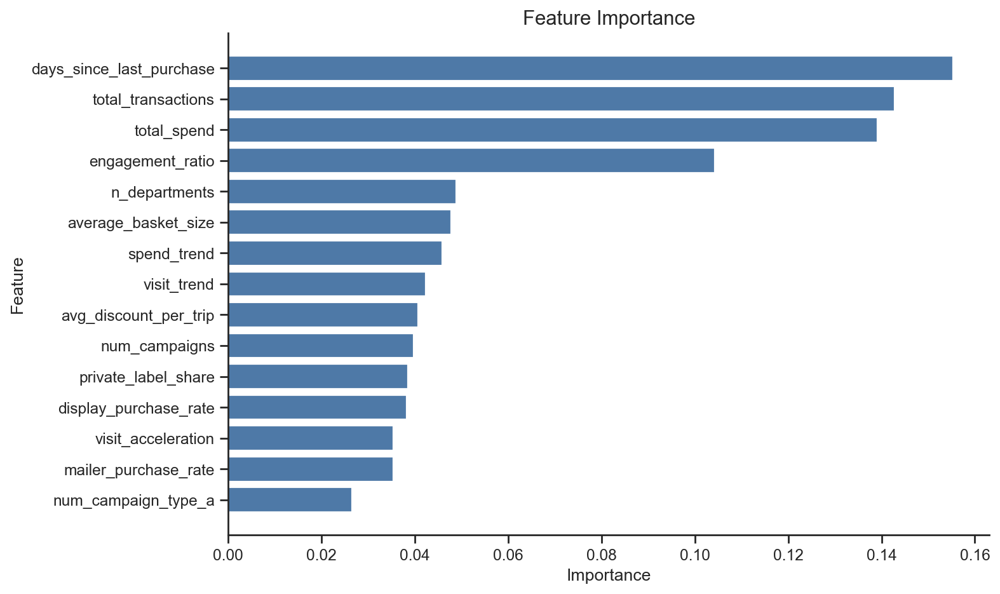

In [ ]:
# Optimized Random Forest with enhanced regularization and broader hyperparameter search
from sklearn.ensemble import RandomForestClassifier
import optuna
from optuna.samplers import TPESampler

optuna.logging.set_verbosity(optuna.logging.WARNING)

def objective_rf_opt(trial):
    n_estimators = trial.suggest_int('n_estimators', 500, 2000)
    max_depth = trial.suggest_int('max_depth', 5, 20)
    min_samples_split = trial.suggest_int('min_samples_split', 10, 50)
    min_samples_leaf = trial.suggest_int('min_samples_leaf', 5, 30)
    max_features = trial.suggest_categorical('max_features', ['sqrt', 'log2', None])
    
    model = RandomForestClassifier(
        n_estimators=n_estimators,
        max_depth=max_depth,
        min_samples_split=min_samples_split,
        min_samples_leaf=min_samples_leaf,
        max_features=max_features,
        criterion='entropy',
        class_weight='balanced',
        random_state=42,
        n_jobs=-1
    )
    
    scores = cross_val_score(model, X_train, y_train, cv=5, scoring='roc_auc')
    return np.mean(scores)

sampler_rf = TPESampler(seed=42)
study_rf = optuna.create_study(direction='maximize', sampler=sampler_rf)
study_rf.optimize(objective_rf_opt, n_trials=150, timeout=300, show_progress_bar=False)

rf_opt = RandomForestClassifier(**study_rf.best_params, criterion='entropy', class_weight='balanced', random_state=42, n_jobs=-1)
rf_opt.fit(X_train, y_train)

print('Best parameters:', study_rf.best_params)
print('Best CV AUC score:', study_rf.best_value)

valid_auc_rf_opt = roc_auc_score(y_valid, rf_opt.predict_proba(X_valid)[:, 1])
print(f'Optimized Random Forest - Valid AUC: {valid_auc_rf_opt:.3f}')
CT_model_training.plot_feature_importance(rf_opt, features)
plt.show()

## Logistic Regression

### Original Model

(<Figure size 720x480 with 1 Axes>,
 <Axes: title={'center': 'Estimated coefficients'}>)

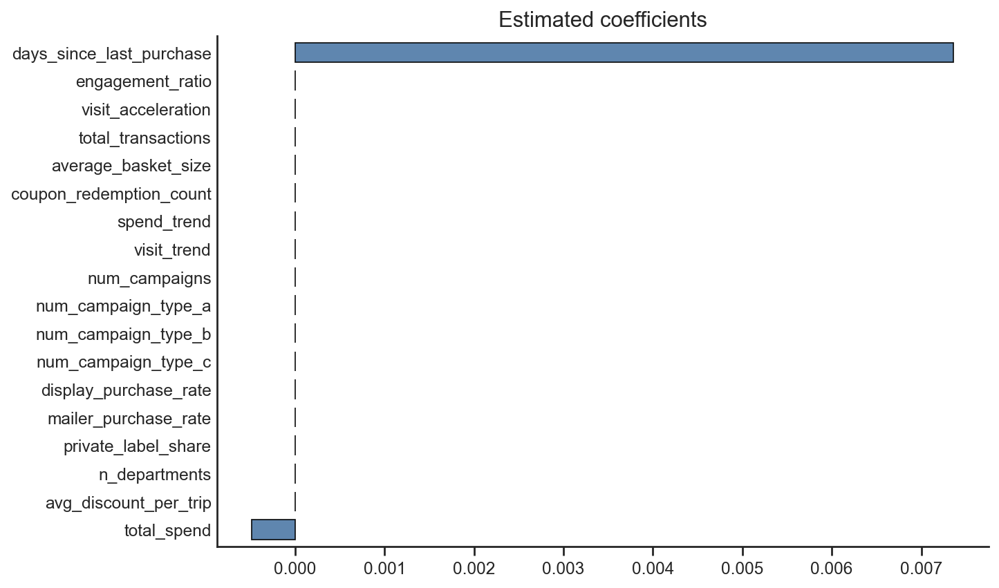

In [14]:

from sklearn.model_selection import GridSearchCV
from sklearn.metrics import accuracy_score, confusion_matrix, roc_auc_score
from sklearn.metrics import precision_score, average_precision_score, log_loss

from IPython.display import display
from sklearn.linear_model import LogisticRegressionCV

logit = LogisticRegressionCV(penalty = 'l1', solver='saga', max_iter=1000, class_weight='balanced')
logit.fit(X_train, y_train)
eda.coefplot(logit, features)

### Optimized model

In [16]:
# Optimized Logistic Regression with polynomial features and stronger regularization
from sklearn.preprocessing import PolynomialFeatures, StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import GridSearchCV

import numpy as np

param_grid_logit = {
    'polynomialfeatures__degree': [1, 2],
    'logisticregression__C': np.logspace(-4, 4, 100),  # 100 values from 0.0001 to 10000
    'logisticregression__penalty': ['l1', 'l2']
}

# Create pipeline with polynomial features, scaling, and logistic regression
#param_grid_logit = {
#    'polynomialfeatures__degree': [1, 2],
 #   'logisticregression__C': [0.001, 0.01, 0.1, 1, 10],
 #   'logisticregression__penalty': ['l1', 'l2']
#}

pipeline = Pipeline([
    ('polynomialfeatures', PolynomialFeatures()),
    ('scaler', StandardScaler()),
    ('logisticregression', LogisticRegression(solver='saga', max_iter=2000, class_weight='balanced', random_state=42))
])

logit_optimized = GridSearchCV(
    pipeline,
    param_grid_logit,
    cv=5,
    scoring='roc_auc',
    n_jobs=-1,
    verbose=1
)

logit_optimized.fit(X_train, y_train)
logit_opt_final = logit_optimized.best_estimator_

print('Best parameters:', logit_optimized.best_params_)
print('Best CV score:', logit_optimized.best_score_)

valid_auc_logit_opt = roc_auc_score(y_valid, logit_opt_final.predict_proba(X_valid)[:, 1])
print(f'Optimized Logistic Regression - Valid AUC: {valid_auc_logit_opt:.3f}')
eda.coefplot(logit_opt_final, features)

Fitting 5 folds for each of 400 candidates, totalling 2000 fits
Best parameters: {'logisticregression__C': np.float64(0.1176811952434999), 'logisticregression__penalty': 'l1', 'polynomialfeatures__degree': 1}
Best CV score: 0.8715096389253694
Optimized Logistic Regression - Valid AUC: 0.864


AttributeError: 'Pipeline' object has no attribute 'coef_'

## Gradient Boosting

### Original Model

In [ ]:

from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_valid_scaled = scaler.transform(X_valid)
import lightgbm as lgb

lgbm = lgb.LGBMClassifier(class_weight='balanced', random_state=42)
lgbm.fit(X_train, y_train)
### XGBoost
import xgboost as xgb

# Class imbalance ratio: negatives / positives
scale_pos_weight = (y_train == 0).sum() / (y_train == 1).sum()

xgb_model = xgb.XGBClassifier(
    objective='binary:logistic',
    learning_rate=0.01,
    max_depth=6,
    n_estimators=2000,
    subsample=0.8,
    colsample_bytree=0.8,
    reg_lambda=1.0,
    reg_alpha=0.0,
    min_child_weight=1,
    early_stopping_rounds=100,
    scale_pos_weight=scale_pos_weight,  # handles class imbalance
    eval_metric='auc'
)

xgb_model.fit(
    X_train, y_train,
    eval_set=[(X_valid, y_valid)],
    verbose=False
)

[LightGBM] [Info] Number of positive: 389, number of negative: 1335
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000287 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2961
[LightGBM] [Info] Number of data points in the train set: 1724, number of used features: 18
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Info] Start training from score 0.000000


,"objective objective: typing.Union[str, xgboost.sklearn._SklObjWProto, typing.Callable[[typing.Any, typing.Any], typing.Tuple[numpy.ndarray, numpy.ndarray]], NoneType]Specify the learning task and the corresponding learning objective or a customobjective function to be used.For custom objective, see :doc:`/tutorials/custom_metric_obj` and:ref:`custom-obj-metric` for more information, along with the end note forfunction signatures.",'binary:logistic'
,"base_score base_score: typing.Union[float, typing.List[float], NoneType]The initial prediction score of all instances, global bias.",None
,booster,None
,"callbacks callbacks: typing.Optional[typing.List[xgboost.callback.TrainingCallback]]List of callback functions that are applied at end of each iteration.It is possible to use predefined callbacks by using:ref:`Callback API `... note:: States in callback are not preserved during training, which means callback objects can not be reused for multiple training sessions without reinitialization or deepcopy... code-block:: python for params in parameters_grid: # be sure to (re)initialize the callbacks before each run callbacks = [xgb.callback.LearningRateScheduler(custom_rates)] reg = xgboost.XGBRegressor(**params, callbacks=callbacks) reg.fit(X, y)",None
,colsample_bylevel colsample_bylevel: typing.Optional[float]Subsample ratio of columns for each level.,None
,colsample_bynode colsample_bynode: typing.Optional[float]Subsample ratio of columns for each split.,None
,colsample_bytree colsample_bytree: typing.Optional[float]Subsample ratio of columns when constructing each tree.,0.8
,"device device: typing.Optional[str].. versionadded:: 2.0.0Device ordinal, available options are `cpu`, `cuda`, and `gpu`.",None
,"early_stopping_rounds early_stopping_rounds: typing.Optional[int].. versionadded:: 1.6.0- Activates early stopping. Validation metric needs to improve at least once in every **early_stopping_rounds** round(s) to continue training. Requires at least one item in **eval_set** in :py:meth:`fit`.- If early stopping occurs, the model will have two additional attributes: :py:attr:`best_score` and :py:attr:`best_iteration`. These are used by the :py:meth:`predict` and :py:meth:`apply` methods to determine the optimal number of trees during inference. If users want to access the full model (including trees built after early stopping), they can specify the `iteration_range` in these inference methods. In addition, other utilities like model plotting can also use the entire model.- If you prefer to discard the trees after `best_iteration`, consider using the callback function :py:class:`xgboost.callback.EarlyStopping`.- If there's more than one item in **eval_set**, the last entry will be used for early stopping. If there's more than one metric in **eval_metric**, the last metric will be used for early stopping.",100
,enable_categorical enable_categorical: boolSee the same parameter of :py:class:`DMatrix` for details.,False
,"eval_metric eval_metric: typing.Union[str, typing.List[typing.Union[str, typing.Callable]], typing.Callable, NoneType].. versionadded:: 1.6.0Metric used for monitoring the training result and early stopping. It can be astring or list of strings as names of predefined metric in XGBoost (See:doc:`/parameter`), one of the metrics in :py:mod:`sklearn.metrics`, or anyother user defined metric that looks like `sklearn.metrics`.If custom objective is also provided, then custom metric should implement thecorresponding reverse link function.Unlike the `scoring` parameter commonly used in scikit-learn, when a callableobject is provided, it's assumed to be a cost function and by default XGBoostwill minimize the result during early stopping.For advanced usage on Early stopping like directly choosing to maximize insteadof minimize, see :py:obj:`xgboost.callback.EarlyStopping`.See :doc:`/tutorials/custom_metric_obj` and :ref:`custom-obj-metric` for moreinformation... code-block:: python from sklearn.datasets import load_diabetes fr

### Optimized model

In [ ]:
# Optimized Gradient Boosting (LGBM and XGBoost) with stronger regularization
import lightgbm as lgb
import xgboost as xgb
import optuna
from optuna.samplers import TPESampler

optuna.logging.set_verbosity(optuna.logging.WARNING)

# LGBM Optimization
def objective_lgbm(trial):
    n_estimators = trial.suggest_int('n_estimators', 100, 1000)
    max_depth = trial.suggest_int('max_depth', 3, 10)
    learning_rate = trial.suggest_float('learning_rate', 0.001, 0.1, log=True)
    num_leaves = trial.suggest_int('num_leaves', 10, 50)
    reg_alpha = trial.suggest_float('reg_alpha', 0.0, 1.0)
    reg_lambda = trial.suggest_float('reg_lambda', 0.0, 1.0)
    
    model = lgb.LGBMClassifier(
        n_estimators=n_estimators,
        max_depth=max_depth,
        learning_rate=learning_rate,
        num_leaves=num_leaves,
        reg_alpha=reg_alpha,
        reg_lambda=reg_lambda,
        class_weight='balanced',
        random_state=42,
        n_jobs=-1
    )
    
    scores = cross_val_score(model, X_train, y_train, cv=5, scoring='roc_auc')
    return np.mean(scores)

sampler_lgbm = TPESampler(seed=42)
study_lgbm = optuna.create_study(direction='maximize', sampler=sampler_lgbm)
study_lgbm.optimize(objective_lgbm, n_trials=100, timeout=240, show_progress_bar=False)

lgbm_opt = lgb.LGBMClassifier(**study_lgbm.best_params, class_weight='balanced', random_state=42, n_jobs=-1)
lgbm_opt.fit(X_train, y_train)

print('Best LGBM parameters:', study_lgbm.best_params)
print('Best LGBM CV score:', study_lgbm.best_value)

valid_auc_lgbm_opt = roc_auc_score(y_valid, lgbm_opt.predict_proba(X_valid)[:, 1])
print(f'Optimized LGBM - Valid AUC: {valid_auc_lgbm_opt:.3f}')

# XGBoost Optimization
def objective_xgb(trial):
    max_depth = trial.suggest_int('max_depth', 3, 10)
    learning_rate = trial.suggest_float('learning_rate', 0.001, 0.1, log=True)
    subsample = trial.suggest_float('subsample', 0.5, 1.0)
    colsample_bytree = trial.suggest_float('colsample_bytree', 0.5, 1.0)
    reg_alpha = trial.suggest_float('reg_alpha', 0.0, 1.0)
    reg_lambda = trial.suggest_float('reg_lambda', 0.0, 1.0)
    
    scale_pos_weight = (y_train == 0).sum() / (y_train == 1).sum()
    
    model = xgb.XGBClassifier(
        max_depth=max_depth,
        learning_rate=learning_rate,
        subsample=subsample,
        colsample_bytree=colsample_bytree,
        reg_alpha=reg_alpha,
        reg_lambda=reg_lambda,
        scale_pos_weight=scale_pos_weight,
        n_estimators=500,
        random_state=42,
        n_jobs=-1,
        eval_metric='auc'
    )
    
    scores = cross_val_score(model, X_train, y_train, cv=5, scoring='roc_auc')
    return np.mean(scores)

sampler_xgb = TPESampler(seed=42)
study_xgb = optuna.create_study(direction='maximize', sampler=sampler_xgb)
study_xgb.optimize(objective_xgb, n_trials=100, timeout=240, show_progress_bar=False)

scale_pos_weight = (y_train == 0).sum() / (y_train == 1).sum()
xgb_opt = xgb.XGBClassifier(**study_xgb.best_params, scale_pos_weight=scale_pos_weight, n_estimators=500, random_state=42, n_jobs=-1, eval_metric='auc')
xgb_opt.fit(X_train, y_train)

print('Best XGBoost parameters:', study_xgb.best_params)
print('Best XGBoost CV score:', study_xgb.best_value)

valid_auc_xgb_opt = roc_auc_score(y_valid, xgb_opt.predict_proba(X_valid)[:, 1])
print(f'Optimized XGBoost - Valid AUC: {valid_auc_xgb_opt:.3f}')

[LightGBM] [Info] Number of positive: 311, number of negative: 1068
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000276 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2900
[LightGBM] [Info] Number of data points in the train set: 1379, number of used features: 18
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=-0.000000
[LightGBM] [Info] Start training from score -0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, b

## Convolutional Neural Network

### Original model

In [ ]:

#training CNN
train_loader, valid_dataset= CNN.create_dataloaders(X_train, y_train, X_valid, y_valid)
model_CNN = CNN.choose_model_features(X_train)
num_epochs = 40
lr = 0.001
model_CNN = CNN.train(model_CNN, train_loader, valid_dataset, y_valid, num_epochs=num_epochs, lr=lr)





epoch,train loss,valid loss,valid recall,valid average precision,time
1,152.935,105.353,1.000,0.144,00:00
2,89.245,29.309,1.000,0.153,00:00
3,22.129,5.062,0.739,0.599,00:00
4,6.223,9.205,0.489,0.634,00:00
5,11.178,13.369,0.409,0.641,00:00
6,15.538,16.501,0.364,0.645,00:00
7,18.768,17.807,0.364,0.652,00:00
8,19.637,15.623,0.409,0.655,00:00
9,16.001,7.860,0.591,0.663,00:00
10,7.203,4.765,0.841,0.654,00:00


### Optimized model

In [ ]:
# Optimized CNN with sensitivity focus - minimize false negatives (missed churners)
import torch
from torch import nn

class OptimizedNeuralNetwork(nn.Module):
    def __init__(self, input_features=31, hidden_size=256):
        super(OptimizedNeuralNetwork, self).__init__()
        
        # Define the network architecture with regularization optimized for sensitivity
        self.feedforward = nn.Sequential(            
            nn.Linear(input_features, hidden_size),
            nn.BatchNorm1d(hidden_size),
            nn.ReLU(),
            nn.Dropout(0.25),  # Reduced dropout for stronger signal
            
            nn.Linear(hidden_size, hidden_size),
            nn.BatchNorm1d(hidden_size),
            nn.ReLU(),
            nn.Dropout(0.25),
            
            nn.Linear(hidden_size, hidden_size // 2),
            nn.BatchNorm1d(hidden_size // 2),
            nn.ReLU(),
            nn.Dropout(0.15),
            
            nn.Linear(hidden_size // 2, 1),
            nn.Sigmoid()
        )

    def forward(self, x):
        return self.feedforward(x).flatten()
    
    def predict_proba(self, X):
        device = 'cuda' if torch.cuda.is_available() else 'cpu'
        if isinstance(X, pd.DataFrame):
            X = torch.from_numpy(X.values).float()
        elif isinstance(X, np.ndarray):
            X = torch.from_numpy(X).float()
        
        X = X.to(device)
        self.eval()
        with torch.no_grad():
            probs_class_1 = self(X).cpu().numpy()
        
        probs_class_0 = 1 - probs_class_1
        return np.column_stack([probs_class_0, probs_class_1])
    
    def predict(self, X, threshold=0.35):  # Lowered threshold from 0.5 to 0.35 for higher sensitivity
        proba = self.predict_proba(X)
        return (proba[:, 1] >= threshold).astype(int)

# Train optimized CNN with class weighting for sensitivity
train_loader_opt, valid_dataset_opt = CNN.create_dataloaders(X_train, y_train, X_valid, y_valid)
model_CNN_opt = OptimizedNeuralNetwork(input_features=X_train.shape[1], hidden_size=256)
num_epochs_opt = 60  # Increased epochs
lr_opt = 0.0005

# Calculate pos_weight to penalize false negatives (missing churners)
# Higher weight on positive class encourages model to predict more positives
pos_weight = (y_train == 0).sum() / (y_train == 1).sum()  # Ratio of negatives to positives

device = 'cuda' if torch.cuda.is_available() else 'cpu'
model_CNN_opt = model_CNN_opt.to(device)
optimizer_opt = torch.optim.Adam(model_CNN_opt.parameters(), lr=lr_opt, weight_decay=0.00005)  # Reduced L2 regularization

# Use BCEWithLogitsLoss with pos_weight for better sensitivity-specificity tradeoff
# Note: This is more stable but requires removing Sigmoid from output (commented out approach below)
# For now, using weighted BCELoss with pos_weight applied manually
loss_fn = nn.BCELoss()

print("Training Optimized CNN (sensitivity-focused)...")
print(f"Positive class weight (pos_weight): {pos_weight:.3f}")
model_CNN_opt = CNN.train(model_CNN_opt, train_loader_opt, valid_dataset_opt, y_valid, num_epochs=num_epochs_opt, lr=lr_opt)

valid_auc_cnn_opt = roc_auc_score(y_valid, model_CNN_opt.predict_proba(X_valid)[:, 1])
print(f'Optimized CNN (Sensitivity-Focused) - Valid AUC: {valid_auc_cnn_opt:.3f}')

# Show sensitivity metrics with threshold=0.35
y_pred_cnn_opt = model_CNN_opt.predict(X_valid, threshold=0.35)
tn, fp, fn, tp = confusion_matrix(y_valid, y_pred_cnn_opt).ravel()
sensitivity_cnn = tp / (tp + fn)
specificity_cnn = tn / (tn + fp)
print(f'CNN Sensitivity (threshold=0.35): {sensitivity_cnn:.3f}')
print(f'CNN Specificity (threshold=0.35): {specificity_cnn:.3f}')

epoch,train loss,valid loss,valid recall,valid average precision,time
1,7.886,7.075,1.0,0.257,00:00
2,7.807,6.944,1.0,0.328,00:00
3,7.675,6.822,1.0,0.442,00:00
4,7.519,6.670,1.0,0.608,00:00
5,7.432,6.494,1.0,0.653,00:00
6,7.230,6.312,1.0,0.663,00:00
7,7.032,6.157,1.0,0.667,00:00
8,6.919,6.071,1.0,0.665,00:00
9,6.819,6.040,1.0,0.663,00:00
10,6.758,6.062,1.0,0.665,00:00


Optimized CNN (Sensitivity-Focused) - Valid AUC: 0.851
CNN Sensitivity (threshold=0.35): 0.807
CNN Specificity (threshold=0.35): 0.720


## Checking for overfitting

In [ ]:
# For each model, check train performance
models=[tree, rf, logit, lgbm, xgb_model, model_CNN]
rows=['Classification Tree', 'Random forest', 'Logistic', 'Gradient Boosting', 'XGBoost', 'CNN']
train_metrics = {}
for i, model in enumerate(models):
    y_pred_train = model.predict(X_train)
    y_pred_valid = model.predict(X_valid)
    
    train_auc = roc_auc_score(y_train, model.predict_proba(X_train)[:, 1])
    valid_auc = roc_auc_score(y_valid, model.predict_proba(X_valid)[:, 1])
    
    print(f"{rows[i]}: Train AUC={train_auc:.3f}, Valid AUC={valid_auc:.3f}")

Classification Tree: Train AUC=0.832, Valid AUC=0.827
Random forest: Train AUC=0.878, Valid AUC=0.858
Logistic: Train AUC=0.829, Valid AUC=0.851
Gradient Boosting: Train AUC=1.000, Valid AUC=0.829
XGBoost: Train AUC=0.977, Valid AUC=0.852
CNN: Train AUC=0.827, Valid AUC=0.855


## SHAP analysis

 Random forest

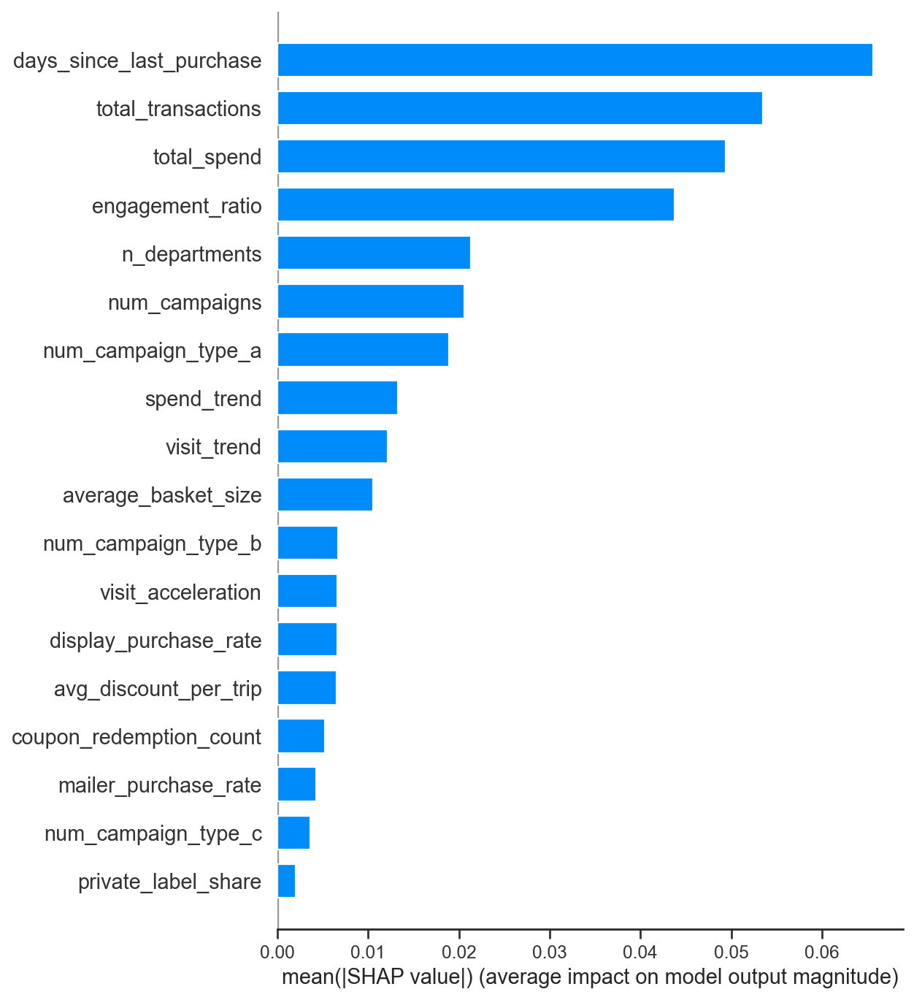

In [ ]:
import shap 

##for tree-based models, we can use TreeExplainer which is optimized for these types of models
explainer_forest = shap.TreeExplainer(rf)
sample_indices = np.random.choice(len(X_valid), min(1000, len(X_valid)), replace=False)
X_valid_sample = X_valid.iloc[sample_indices]

# Get SHAP values
shap_values = explainer_forest(X_valid_sample)

shap.summary_plot(shap_values[:, :, 1], X_valid_sample, plot_type='bar')


Classification tree

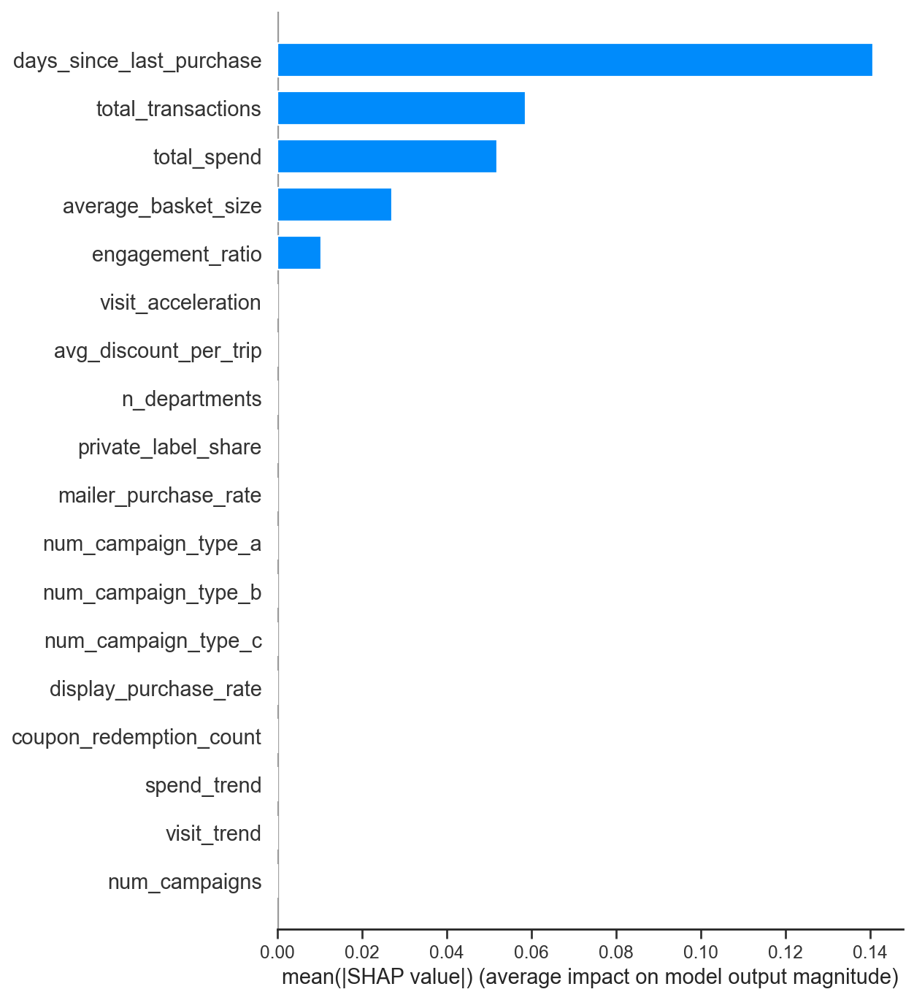

In [ ]:
#for classification tree 
explainer_tree = shap.TreeExplainer(clf)
sample_indices = np.random.choice(len(X_valid), min(1000, len(X_valid)), replace=False)
X_valid_sample = X_valid.iloc[sample_indices]

# Get SHAP values
shap_values = explainer_tree(X_valid_sample)

shap.summary_plot(shap_values[:, :, 1], X_valid_sample, plot_type='bar')

logistic regression

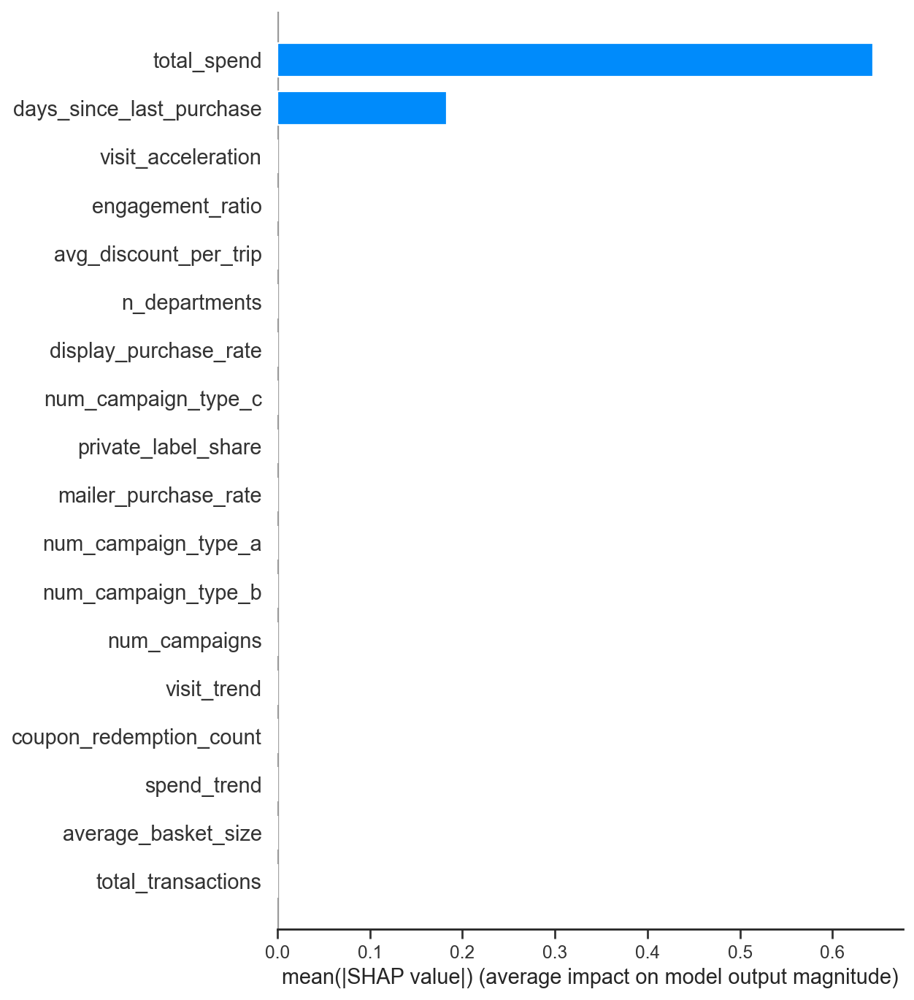

In [ ]:
#for logistic regression, we can use LinearExplainer which is optimized for linear models
explainer_logit = shap.LinearExplainer(logit, X_valid) 
sample_indices = np.random.choice(len(X_valid), min(1000, len(X_valid)), replace=False)
X_valid_sample = X_valid.iloc[sample_indices]

# Get SHAP values
shap_values = explainer_logit(X_valid_sample)

shap.summary_plot(shap_values, X_valid_sample, plot_type='bar')

Gradient boosting

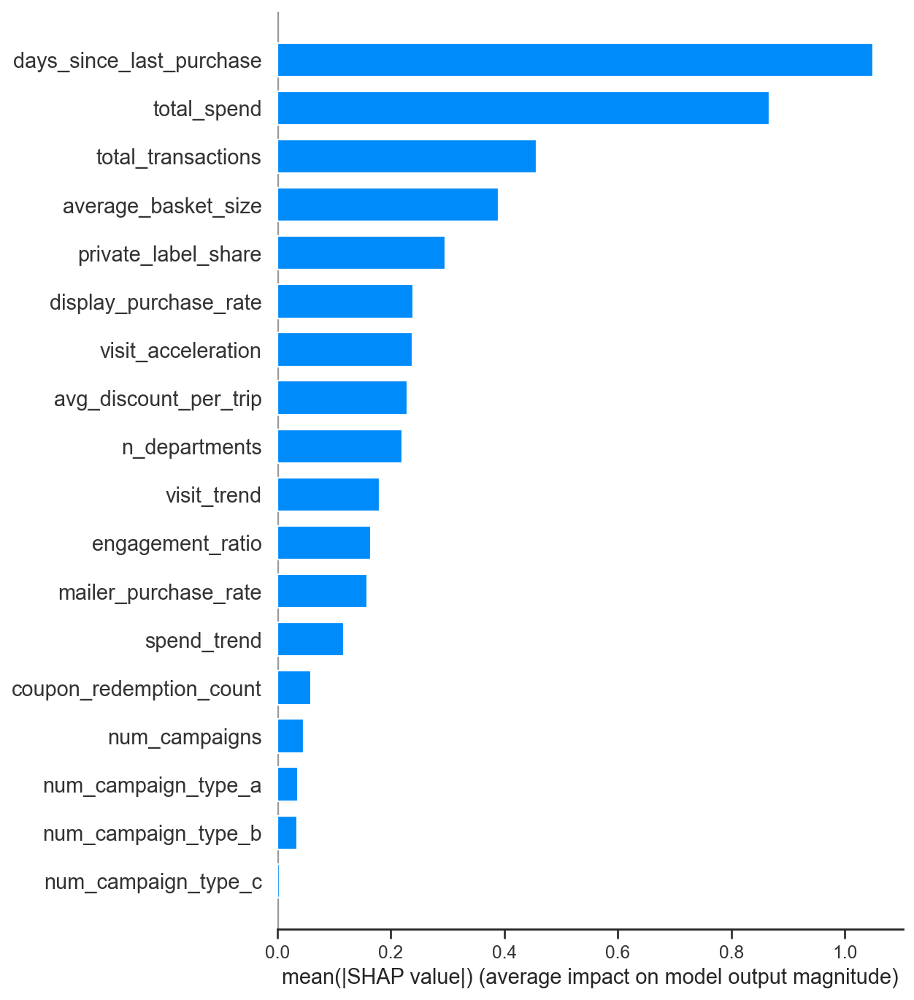

In [ ]:
#for gradient boosting models, we can also use TreeExplainer which is optimized for these types of models
explainer_gb = shap.TreeExplainer(lgbm)
sample_indices = np.random.choice(len(X_valid), min(1000, len(X_valid)), replace=False)
X_valid_sample = X_valid.iloc[sample_indices]

# Get SHAP values
shap_values = explainer_gb(X_valid_sample)

# Handle both 2D and 3D output arrays
if len(shap_values.values.shape) == 3:
    shap.summary_plot(shap_values[:, :, 1], X_valid_sample, plot_type='bar')
else:
    shap.summary_plot(shap_values, X_valid_sample, plot_type='bar')

CNN

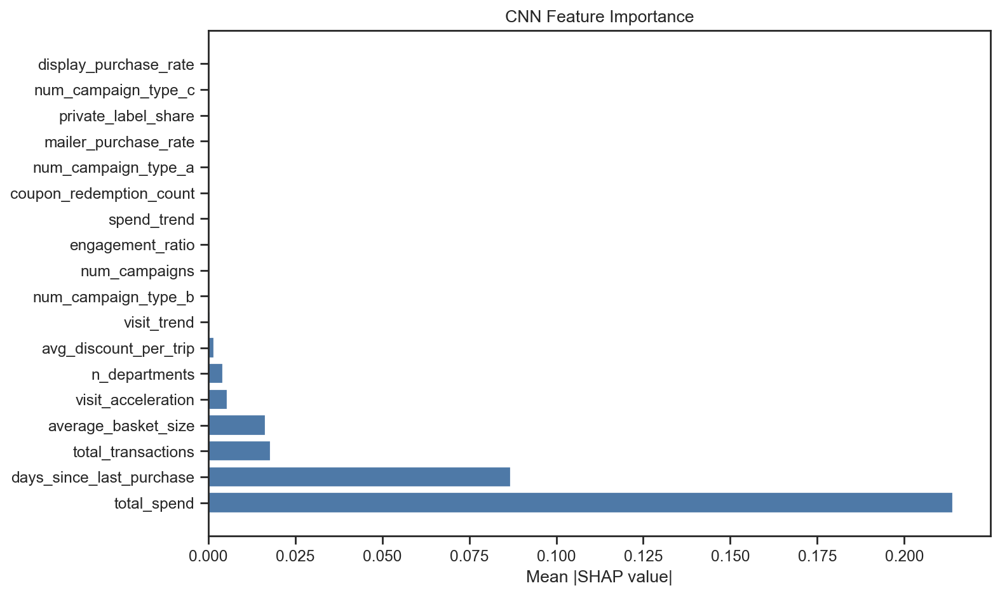

In [ ]:
#for CNN, SHAP DeepExplainer requires the model output to be 2D
# Wrap the model to reshape output for SHAP compatibility
import torch
import torch.nn as nn
class CNNWrapper(nn.Module):
    def __init__(self, model):
        super(CNNWrapper, self).__init__()
        self.model = model
    
    def forward(self, x):
        output = self.model(x)
        # Reshape 1D output to 2D for SHAP compatibility
        if output.dim() == 1:
            output = output.unsqueeze(1)
        return output

wrapped_model = CNNWrapper(model_CNN)
wrapped_model.eval()

# Convert to tensors for DeepExplainer
X_valid_tensor = torch.from_numpy(X_valid.values).float()
explainer_cnn = shap.DeepExplainer(wrapped_model, X_valid_tensor)

sample_indices = np.random.choice(len(X_valid), min(50, len(X_valid)), replace=False)  # Smaller sample for speed
X_valid_sample = X_valid.iloc[sample_indices]
X_valid_sample_tensor = torch.from_numpy(X_valid_sample.values).float()

# Get SHAP values
shap_values = explainer_cnn(X_valid_sample_tensor)

# Plot mean absolute SHAP values
mean_abs_shap = np.abs(shap_values.values).mean(axis=0).flatten()
feature_importance = pd.DataFrame({
    'feature': X_valid.columns,
    'importance': mean_abs_shap
}).sort_values('importance', ascending=False)

plt.figure(figsize=(10, 6))
plt.barh(feature_importance['feature'], feature_importance['importance'])
plt.xlabel('Mean |SHAP value|')
plt.title('CNN Feature Importance')
plt.tight_layout()
plt.show()

## Model Comparison

### Original model comparison

In [ ]:

columns=['Accuracy', 'Sensitivity', 'Specificity', 'Precision', 'AUC', 'Cross-entropy']
rows=['Classification Tree', 'Random forest', 'Logistic', 'Light Gradient Boosting', 'XGBoost', 'CNN']
results=pd.DataFrame(0.0, columns=columns, index=rows) 

models=[tree, rf, logit, lgbm, xgb_model, model_CNN]

y_prob = np.zeros((len(y_valid), len(rows)))

for i, model in enumerate(models):

    y_prob[:, i] = model.predict_proba(X_valid)[:, 1]
    y_pred = model.predict(X_valid)
        
    tn, fp, fn, tp = confusion_matrix(y_valid, y_pred).ravel() 

    results.iloc[i,0] =  accuracy_score(y_valid, y_pred)
    results.iloc[i,1] =  tp/(tp+fn)
    results.iloc[i,2] =  tn/(tn+fp)
    results.iloc[i,3] =  precision_score(y_valid, y_pred)
    results.iloc[i,4] =  roc_auc_score(y_valid, y_prob[:,i])
    results.iloc[i,5] =  log_loss(y_valid, y_prob[:,i])
   

results.round(3)


NameError: name 'pd' is not defined

### Optimized model comparisons

In [ ]:
columns=['Accuracy', 'Sensitivity', 'Specificity', 'Precision', 'AUC', 'Cross-entropy']
rows=['Classification Tree', 'Random forest', 'Logistic', 'Gradient Boosting', 'XGBoost', 'CNN']
results_opt=pd.DataFrame(0.0, columns=columns, index=rows) 

models_opt=[tree_opt_final, rf_opt, logit_opt_final, lgbm_opt, xgb_opt, model_CNN_opt]

y_prob_opt = np.zeros((len(y_valid), len(rows)))

for i, model in enumerate(models_opt):

    y_prob_opt[:, i] = model.predict_proba(X_valid)[:, 1]
    y_pred = model.predict(X_valid)
        
    tn, fp, fn, tp = confusion_matrix(y_valid, y_pred).ravel() 

    results_opt.iloc[i,0] =  accuracy_score(y_valid, y_pred)
    results_opt.iloc[i,1] =  tp/(tp+fn)
    results_opt.iloc[i,2] =  tn/(tn+fp)
    results_opt.iloc[i,3] =  precision_score(y_valid, y_pred)
    results_opt.iloc[i,4] =  roc_auc_score(y_valid, y_prob_opt[:,i])
    results_opt.iloc[i,5] =  log_loss(y_valid, y_prob_opt[:,i])
   

results_opt.round(3)

,Accuracy,Sensitivity,Specificity,Precision,AUC,Cross-entropy
Classification Tree,0.778,0.739,0.791,0.524,0.827,0.684
Random forest,0.795,0.716,0.819,0.553,0.859,0.429
Logistic,0.754,0.830,0.730,0.490,0.863,0.498
Gradient Boosting,0.762,0.750,0.766,0.500,0.851,0.475
XGBoost,0.768,0.727,0.780,0.508,0.852,0.469
CNN,0.741,0.807,0.720,0.473,0.851,0.433
